In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt

import requests

import json
import urllib
import zipfile
from PIL import ImageDraw
from PIL import Image
import json
import random
import shutil

# COCO

In [2]:
COCO_CLASSES_URL = "https://raw.githubusercontent.com/amikelive/coco-labels/master/coco-labels-2014_2017.txt"
input_data_path = "./ADE20K/code/ADE20K_2016_07_26"

def load_ADE20K_classes(input_data_path):
    from scipy.io import loadmat
    mat_path = os.path.join(input_data_path, "index_ade20k.mat")
    object_names = loadmat(mat_path)['index']['objectnames'][0][0][0]
    ADE20K_CLASSES = {}
    ADE20K_CLASSES_reverse = {}
    for i in range(len(object_names)):
        ADE20K_CLASSES[object_names[i][0]] = i+1
        ADE20K_CLASSES_reverse[i+1] = object_names[i][0]
    return ADE20K_CLASSES, ADE20K_CLASSES_reverse

ADE20K_CLASSES, ADE20K_CLASSES_reverse = load_ADE20K_classes(input_data_path)

In [3]:
COCO_ANN_URL = "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
def load_COCO(COCO_ANN_URL, tmp_path):
    import json
    zip_path, hdrs = urllib.request.urlretrieve(COCO_ANN_URL, os.path.join(tmp_path, 
                                                                           "annotations_trainval2017.zip"))
    #logger.info(f"Extracting {zip_path} to temporary folder {tmp_path}...")
    print(f"Extracting {zip_path} to temporary folder {tmp_path}...")
    with zipfile.ZipFile(f"{zip_path}", 'r') as z:
        z.extractall(f"{tmp_path}")
    annot_json_path =  os.path.join(tmp_path, 
                                    "annotations", "instances_val2017.json")
    categories = json.load(open(annot_json_path, 'r'))['categories']
    ids = list(map(lambda d: d['id'], categories))
    labels = list(map(lambda d: d['name'], categories))
    COCO_CLASSES_reverse = dict(zip(ids, labels))
    COCO_CLASSES = dict(zip(labels, ids))
    return COCO_CLASSES, COCO_CLASSES_reverse
COCO_CLASSES, COCO_CLASSES_reverse =load_COCO(COCO_ANN_URL,"./tmp")

KeyboardInterrupt: 

In [ ]:
COCO_CLASSES

In [4]:
def create_ann(ann_path):
    with open(ann_path, 'r') as f:
        content = f.read()
    det_res = content.split("detection_results")[1:]
    annot = {}
    for det in det_res:
        img_name = det.split('"')[1]
        annot[img_name] = {}
        objects = det.split("objects")[1:]
        for i_obj, obj in enumerate(objects):
            obj_split = obj.split("\n")
            annot[img_name][i_obj] = {}
            annot[img_name][i_obj]["nbbox"] = [0,0,0,0]
            for s in obj_split:

                if "class_id" in s:
                    annot[img_name][i_obj]["class_id"] = int(s.split(" ")[-1])
                if "top" in s:
                    annot[img_name][i_obj]["nbbox"][0] = float(s.split(" ")[-1])
                if "bot" in s:
                    annot[img_name][i_obj]["nbbox"][1] = float(s.split(" ")[-1])
                if "left" in s:
                    annot[img_name][i_obj]["nbbox"][2] = float(s.split(" ")[-1])
                if "right" in s:
                    annot[img_name][i_obj]["nbbox"][3] = float(s.split(" ")[-1])
    return annot

In [5]:
def plot_bbox(annot, folder_img_path):
    all_img_annot_key = list(annot.keys())
    #random.shuffle(all_img_annot_key)
    for i_img, img_name in enumerate(all_img_annot_key):
        img_path = os.path.join(folder_img_path, img_name)
        if i_img < 60 and os.path.exists(img_path):
            img = plt.imread(img_path)
            N,M = img.shape[0], img.shape[1]
            plt.figure()
            title = ""
            image = Image.open(img_path)
            for k_obj, obj in enumerate(annot[img_name].keys()):
                coco_label = annot[img_name][obj]["class_id"]
                bbox = annot[img_name][obj]["nbbox"]
                title += str(coco_label) 
                
                if coco_label in COCO_CLASSES_reverse:
                    title += COCO_CLASSES_reverse[coco_label]
                else:
                    print(coco_label, "does n exist")
                if k_obj%7==0:
                    title += "\n"
                top_left = (bbox[2]*M, bbox[0]*N)
                top_right = (bbox[3]*M, bbox[0]*N)
                bot_left = (bbox[2]*M, bbox[1]*N)
                bot_right = (bbox[3]*M, bbox[1]*N)
                #plt.plot(*top_left, 'b*')
                #plt.plot(*top_right, 'b*')
                #plt.plot(*bot_left, 'b*')
                #plt.plot(*bot_right, 'b*')
                
                draw_box(ImageDraw.Draw(image),top_left, bot_right )
                #ImageDraw.Draw(image).rectangle([top_left, bot_right], width=3, outline="red")
            plt.imshow(image)
            plt.title(title + "\n" + img_name)
        

In [6]:
def draw_box(draw,top_left, bot_right):
  """Draws the bounding box and label for each object."""
  draw.rectangle([top_left, bot_right], width=3,
                   outline='red')
   

In [7]:
def check_annotations(img_folder, annotation_txt_path):
    ann = create_ann(annotation_txt_path)
    plot_bbox(ann, img_folder)
    return ann

In [8]:
test = create_ann(ann_txt)
list_n_bbox = list(map(lambda img: len(test[img].keys()), test.keys()))

NameError: name 'ann_txt' is not defined

In [9]:
img_folder = "/home/cindy/Documents/projets/MLPerf/script/TEST_SCRIPT_google/mobile_app/tmp_dataset_script/img"
ann_txt =  "/home/cindy/Documents/projets/MLPerf/script/TEST_SCRIPT_google/mobile_app/java/org/mlperf/inference/assets/coco_val.pbtxt"
ann = check_annotations(img_folder,ann_txt)

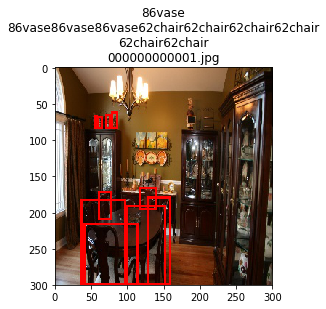

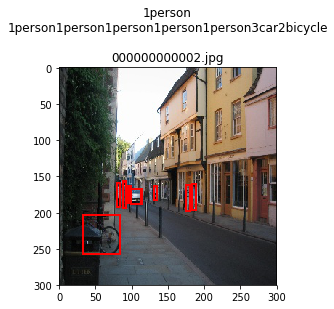

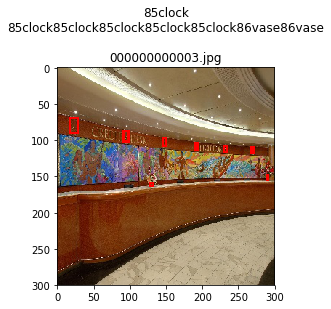

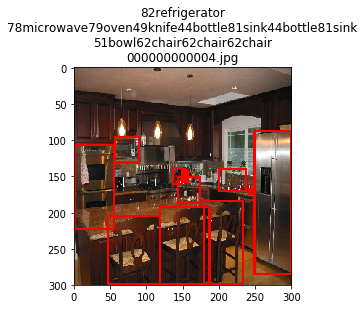

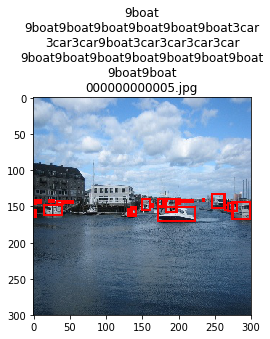

...

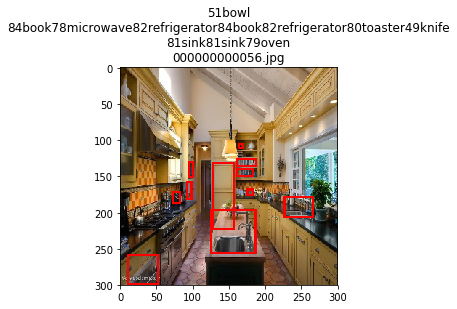

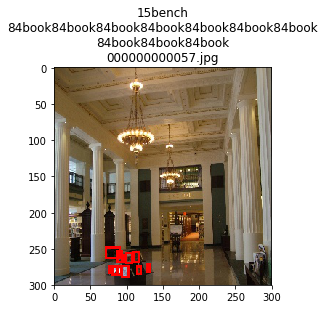

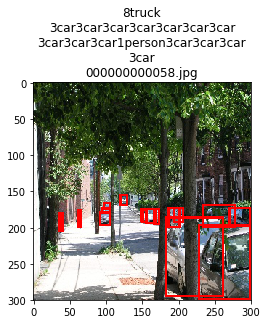

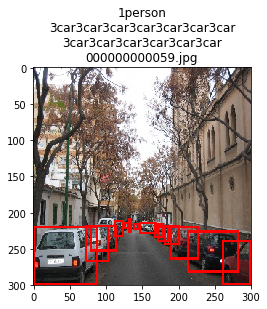

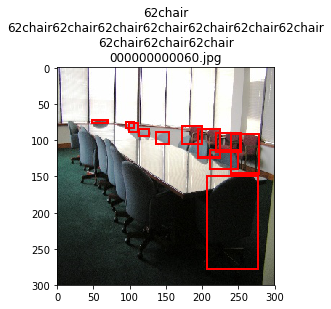

In [101]:
ann_path = "/home/cindy/Documents/projets/MLPerf/script/TEST_SCRIPT/mobile_app/java/org/mlperf/inference/assets/coco_val.pbtxt"
ann = create_ann(ann_path)

img_path_ade ="/home/cindy/Documents/projets/MLPerf/script/TEST_SCRIPT/mobile_app/tmp_dataset_script/img"
plot_bbox(ann, img_path_ade)

json_map = json.load(open("/home/cindy/Documents/projets/MLPerf/script/TEST_SCRIPT/dico.json","r"))

In [102]:
ADE20K_CLASSES['sofa, couch, lounge']

2473

In [76]:
list(COCO_CLASSES.keys())


['person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'backpack',
 'umbrella',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'dining table',
 'toilet',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

In [51]:
import json
a  = {}
a['e'] = "e"
json.dump(a,open("./supprim.json",'w'))

In [10]:
img_path_coco = "/home/cindy/Documents/projets/MLPerf/datasets/coco/coco/val2017/"
ann_path_original = "/home/cindy/Documents/projets/MLPerf/mobile_app/java/org/mlperf/inference/assets/coco_val.pbtxt"

In [11]:
ann_orig = create_ann(ann_path_original)

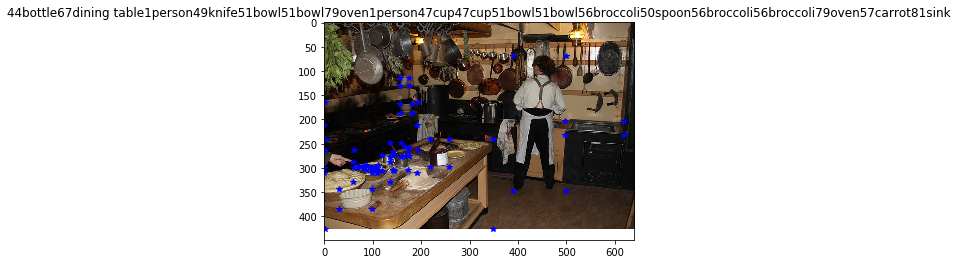

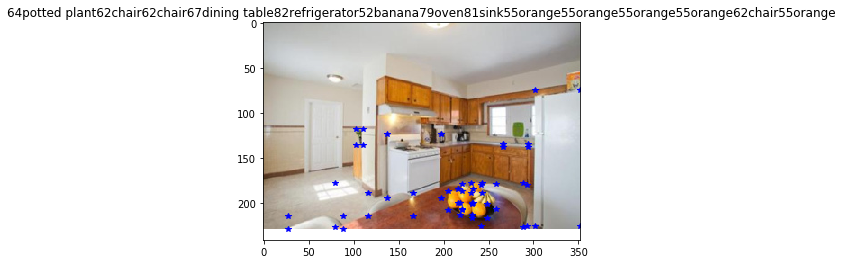

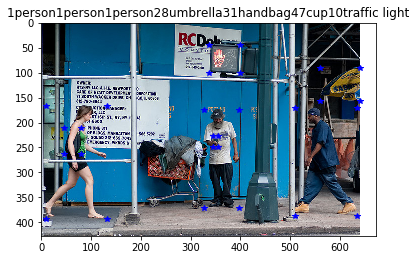

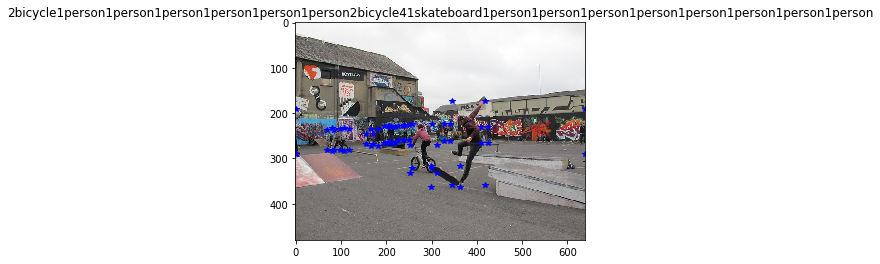

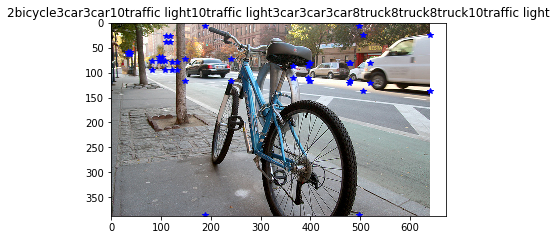

...

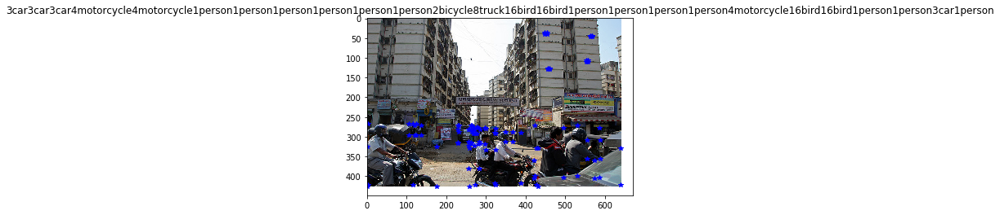

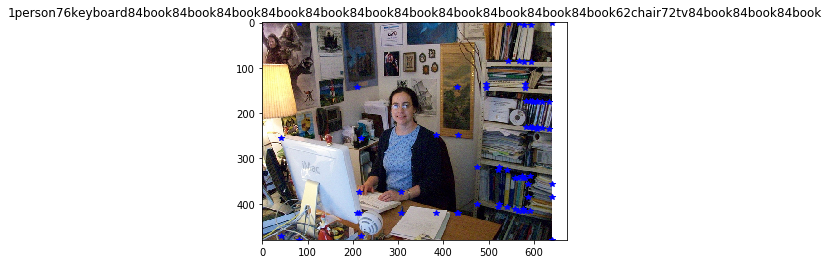

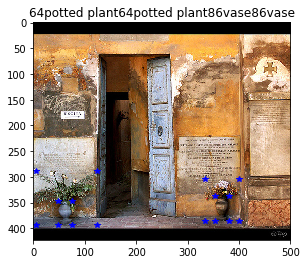

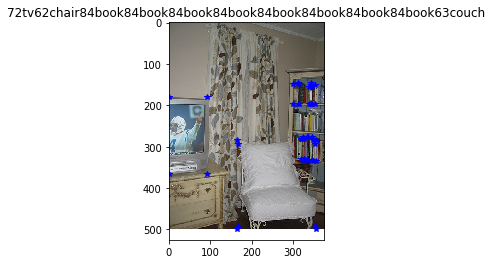

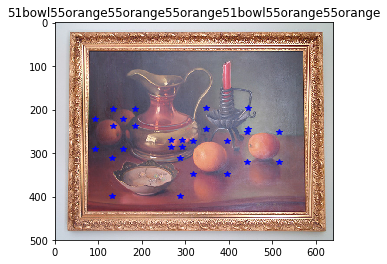

In [12]:
plot_bbox(ann_orig,img_path_coco)

# IMAGENET

In [6]:
IMAGENET_CLASSES_URL = "https://gist.githubusercontent.com/yrevar/942d3a0ac09ec9e5eb3a/raw/238f720ff059c1f82f368259d1ca4ffa5dd8f9f5/imagenet1000_clsidx_to_labels.txt"
IMAGENET_CLASSES =  {v:k for (k,v) in eval(requests.get(IMAGENET_CLASSES_URL).text).items()}
IMAGENET_CLASSES_reverse =  {k:v for (k,v) in eval(requests.get(IMAGENET_CLASSES_URL).text).items()}
img_folder = "/home/cindy/Documents/projets/MLPerf/script/TEST_SCRIPT_google/mobile_app/tmp_dataset_script/img"
ann_txt =  "/home/cindy/Documents/projets/MLPerf/script/TEST_SCRIPT_google/mobile_app/java/org/mlperf/inference/assets/imagenet_val.txt"

img_folder=  "/home/cindy/Documents/projets/MLPerf/script/freedomtan/imagenet/img"
ann_txt=  "/home/cindy/Documents/projets/MLPerf/script/freedomtan/imagenet/imagenet_val.txt"
def plot_img_label(img_folder,ann_txt):
    list_img = os.listdir(img_folder)
    list_img.sort()
    with open(ann_txt,'r') as f:
        content = f.read()
    content = list(map(lambda x: int(x), content.split("\n")[:-1]))
    for i,img_name in enumerate(list_img):
        if i < 30:
            img = plt.imread(os.path.join(img_folder, img_name))
            plt.figure()
            plt.imshow(img)
            plt.title(IMAGENET_CLASSES_reverse[content[i]])

/home/cindy/miniconda3/envs/mainenv/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


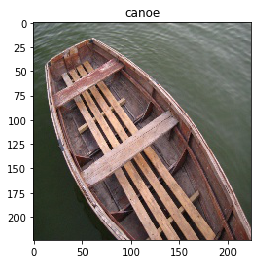

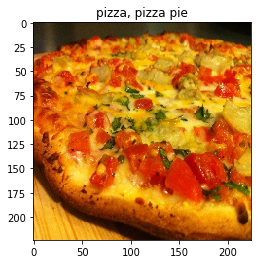

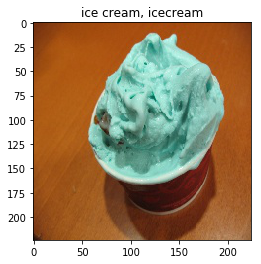

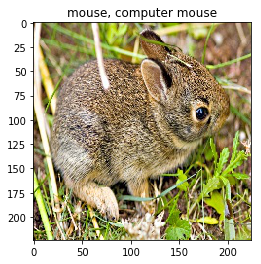

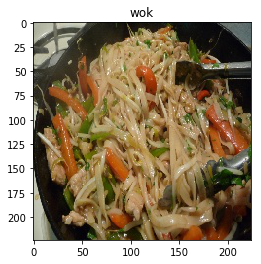

...

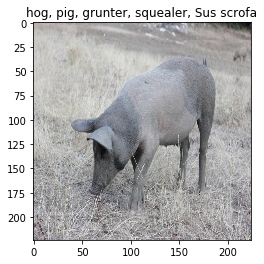

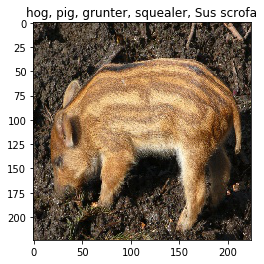

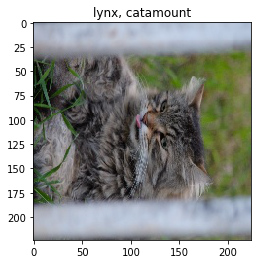

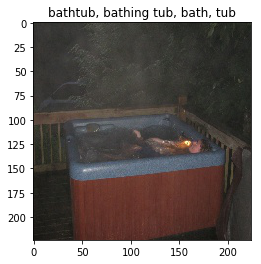

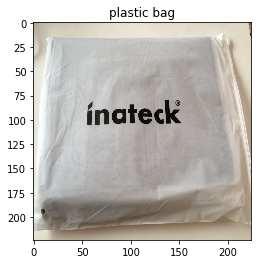

In [7]:
plot_img_label(img_folder,ann_txt)

In [27]:
IMAGENET_CLASSES

{'tench, Tinca tinca': 0,
 'goldfish, Carassius auratus': 1,
 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias': 2,
 'tiger shark, Galeocerdo cuvieri': 3,
 'hammerhead, hammerhead shark': 4,
 'electric ray, crampfish, numbfish, torpedo': 5,
 'stingray': 6,
 'cock': 7,
 'hen': 8,
 'ostrich, Struthio camelus': 9,
 'brambling, Fringilla montifringilla': 10,
 'goldfinch, Carduelis carduelis': 11,
 'house finch, linnet, Carpodacus mexicanus': 12,
 'junco, snowbird': 13,
 'indigo bunting, indigo finch, indigo bird, Passerina cyanea': 14,
 'robin, American robin, Turdus migratorius': 15,
 'bulbul': 16,
 'jay': 17,
 'magpie': 18,
 'chickadee': 19,
 'water ouzel, dipper': 20,
 'kite': 21,
 'bald eagle, American eagle, Haliaeetus leucocephalus': 22,
 'vulture': 23,
 'great grey owl, great gray owl, Strix nebulosa': 24,
 'European fire salamander, Salamandra salamandra': 25,
 'common newt, Triturus vulgaris': 26,
 'eft': 27,
 'spotted salamander, Ambystoma macu